In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import datetime as dt

import plotly.express as px
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns

from ray import tune
from ray.air import session
from ray.train import Checkpoint

from recsys4daos.utils.notebooks import download_plotly, download_matplotlib
import paths

pio.templates.default = 'seaborn'
sns.set_theme()

In [2]:
SPLITS_FREQ = 'W-THU'
SPLITS_NORMALIZE = True # Wether or not to move everything to 00:00
CUTOFF_DATE = dt.datetime.fromisoformat("2023-07-29")
RAY_RESULTS_PATH = '~/ray_results3.11'
ORG_NAME = 'Decentraland'
LAST_FOLDS = 10 # Used for asserts
LAST_FOLD_DATE_STR: str = '2023-07-13'

OPTIM_METRIC = 'map@10'
OPTIM_MODE = 'max'

SAMPLES_PER_SPLIT: int = 100 # See 07_microsoft_tuning.ipynb

In [3]:
# Parameters
EXECUTION_ID = "2024-09-04T10:00"
ORG_NAME = "Genesis Alpha"
SPLITS_FREQ = "7d"
LAST_FOLDS = 10
SPLITS_NORMALIZE = True
LAST_FOLD_DATE_STR = "2019-12-04"


In [4]:
RAY_RESULTS_PATH = Path(RAY_RESULTS_PATH).expanduser()
assert RAY_RESULTS_PATH.is_dir()

## Get ray results

In [5]:
fname_glob = paths.lightgcn_ray_tune_fname(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, OPTIM_METRIC, fold='glob')
fname_glob

'Genesis Alpha/LightGCN_7d_normalize_map@10_fold=[0-9]*'

In [6]:
last_experiments = sorted(RAY_RESULTS_PATH.glob(fname_glob))
print(f"Found {len(last_experiments)} folds")

class TrainLightGCN:
    def __init__(self):
        raise NotImplementedError

tuners = [ tune.Tuner.restore(str(l), TrainLightGCN) for l in last_experiments ]
result_grids = [ tuner.get_results() for tuner in tuners ]
assert len(result_grids) == LAST_FOLDS, f"Waiting for full experiment to run {len(result_grids)}/{LAST_FOLDS}"

for i, rg in enumerate(result_grids):
    print(f"Fold: {i}, {rg.num_terminated} finished, {rg.num_errors} errors")
    assert rg.num_terminated == SAMPLES_PER_SPLIT
    assert rg.num_errors == 0, "There should be no errors"

Found 10 folds


Fold: 0, 100 finished, 0 errors
Fold: 1, 100 finished, 0 errors
Fold: 2, 100 finished, 0 errors
Fold: 3, 100 finished, 0 errors
Fold: 4, 100 finished, 0 errors
Fold: 5, 100 finished, 0 errors
Fold: 6, 100 finished, 0 errors
Fold: 7, 100 finished, 0 errors
Fold: 8, 100 finished, 0 errors
Fold: 9, 100 finished, 0 errors


In [7]:
# Checking data from just one experiment
pd.concat(result_grids[0]._experiment_analysis.trial_dataframes.values())

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,node_ip,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,29,5,0.557819,0.554690,0.003129,0.015000,0.066667,0.066667,0.066667,0.066667,...,147.96.81.131,0.360175,1,9,86,2,0.0006,0.001343,21d,2019-10-02T00:00:00
1,29,10,0.533044,0.529763,0.003281,0.015000,0.066667,0.066667,0.066667,0.066667,...,147.96.81.131,0.524750,2,9,86,2,0.0006,0.001343,21d,2019-10-02T00:00:00
2,29,15,0.509749,0.506289,0.003460,0.015000,0.066667,0.066667,0.066667,0.066667,...,147.96.81.131,0.692841,3,9,86,2,0.0006,0.001343,21d,2019-10-02T00:00:00
3,29,20,0.492722,0.489112,0.003610,0.015000,0.066667,0.066667,0.066667,0.066667,...,147.96.81.131,0.860289,4,9,86,2,0.0006,0.001343,21d,2019-10-02T00:00:00
4,29,25,0.467536,0.463769,0.003767,0.015000,0.066667,0.066667,0.066667,0.066667,...,147.96.81.131,1.027883,5,9,86,2,0.0006,0.001343,21d,2019-10-02T00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,69,180,0.002586,0.002332,0.000255,0.016667,0.033333,0.033333,0.033333,0.200000,...,147.96.81.131,7.252939,36,10,511,1,0.0008,0.000011,90d,2019-10-02T00:00:00
36,69,185,0.002608,0.002353,0.000254,0.016667,0.033333,0.033333,0.033333,0.200000,...,147.96.81.131,7.453543,37,10,511,1,0.0008,0.000011,90d,2019-10-02T00:00:00
37,69,190,0.002202,0.001942,0.000260,0.016667,0.033333,0.033333,0.033333,0.200000,...,147.96.81.131,7.661921,38,10,511,1,0.0008,0.000011,90d,2019-10-02T00:00:00
38,69,195,0.002440,0.002180,0.000260,0.016667,0.033333,0.033333,0.033333,0.200000,...,147.96.81.131,7.862641,39,10,511,1,0.0008,0.000011,90d,2019-10-02T00:00:00


## Create dataframe with all results

In [8]:
# Read dataframe and drop some unneeded columns
# rdf = pd.concat([rg.get_dataframe(TARGET, 'max') for rg in result_grids ])
rdf = pd.concat([ pd.concat(rg._experiment_analysis.trial_dataframes.values()) for rg in result_grids ])

drop_cols = [
    'timestamp', 'node_ip', 'pid', 'hostname', 'time_since_restore', # 'checkpoint_dir_name', 'trial_id', # 'logdir'
    'model_recall', 'model_ndcg', 'model_precision', 'model_map', 
    'time_train', 'time_eval', 'time_total_s', 'time_this_iter_s',
    'training_iteration', 'iterations_since_restore',
    # 'recall@5', 'map@5', 'recall@10', 'map@10',
]
rdf = rdf.drop(columns=drop_cols)
rdf = rdf.drop(columns=['date']).rename(columns={'config/__trial_index__': 'config/fold', 'iteration':'config/iteration'})
rdf['config/fold'] = pd.to_datetime(rdf['config/fold'])
# rdf = rdf[rdf['done']]
print(rdf.columns)

for c in ['config/batch_size']: #, 'config/embedding_dim']:
    rdf[c] = 2**rdf[c]

# rdf[(rdf['config/fold'] >= 1) & (rdf['iteration'] > 10)].sort_values('precision@5').tail()
# Display some results
rdf.sort_values(OPTIM_METRIC).tail()

Index(['real_batch_size', 'config/iteration', 'loss', 'mf_loss', 'emb_loss',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_rec', 'time_total_train', 'time_total_test', 'done', 'trial_id',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_size',
       'config/fold'],
      dtype='object')


,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
4,50,25,0.461057,0.455752,0.005305,0.720000,0.333333,0.232000,0.1400,0.093333,...,0.667727,False,d053b678,256,724,4,0.0003,0.001031,60d,2019-10-16
5,50,30,0.414103,0.407881,0.006222,0.720000,0.333333,0.224000,0.1400,0.093333,...,0.800245,False,d053b678,256,724,4,0.0003,0.001031,60d,2019-10-16
3,50,20,0.523703,0.519146,0.004557,0.720000,0.346667,0.232000,0.1400,0.093333,...,0.534552,False,d053b678,256,724,4,0.0003,0.001031,60d,2019-10-16
0,100,5,0.576659,0.576486,0.000173,0.750000,0.291667,0.191667,0.1125,0.075000,...,0.133125,False,e4ef755e,128,97,4,0.0021,0.000061,10YE,2019-10-09
2,39,15,0.386764,0.385267,0.001497,0.833333,0.291667,0.191667,0.1125,0.075000,...,0.402916,False,789f9509,128,1,1,0.3809,0.000215,30d,2019-10-09


### Define K_RECOMMENDATIONS

In [9]:
K_RECOMMENDATIONS = { int(c.split('@')[1]) for c in rdf.columns if '@' in c }
K_RECOMMENDATIONS

{1, 3, 5, 10, 15, 100}

## Assert that every experiment was completed

In [10]:
_config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

# _s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
# print(_s)

# Cuidado, no es aleatorio sin reemplazamiento, por lo que
# alguna config, por casualidad, puede estar repetida y es necesario
# usar trial_id
_config_cols.append('trial_id')

_s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
print(_s)
assert all(_s == SAMPLES_PER_SPLIT), "Insufficient number of samples" 

config/fold
2019-10-02    100
2019-10-09    100
2019-10-16    100
2019-10-23    100
2019-10-30    100
2019-11-06    100
2019-11-13    100
2019-11-20    100
2019-11-27    100
2019-12-04    100
dtype: int64


## Get total execution time

In [11]:
_config_cols = ['trial_id'] + [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

last_iteration_time = rdf.groupby(_config_cols)['time_total_train'].max()
print(last_iteration_time)
print("Mean exec time: ", dt.timedelta(seconds=last_iteration_time.mean()))
print("Total exec time:", dt.timedelta(seconds=last_iteration_time.sum()))

trial_id  config/batch_size  config/embedding_dim  config/conv_layers  config/learning_rate  config/l2     config/window_size  config/fold
0068121b  256                531                   1                   0.0011                5.674893e-04  90d                 2019-11-20     2.245126
00d5beda  256                3                     1                   0.0168                6.142779e-06  21d                 2019-11-27     1.236487
01592441  512                28                    4                   0.0001                7.314806e-07  10YE                2019-10-16     3.428668
0168412d  64                 138                   4                   0.0004                1.271744e-04  60d                 2019-11-20     2.356416
01878d08  128                10                    1                   0.0364                2.352933e-07  10YE                2019-10-23     3.596575
                                                                                                          

In [12]:
# Number of iterations
rdf.groupby('trial_id')['config/iteration'].max().describe()

count    1000.0
mean      200.0
std         0.0
min       200.0
25%       200.0
50%       200.0
75%       200.0
max       200.0
Name: config/iteration, dtype: float64

## Get baseline data

In [13]:
bdf = paths.load_openpop(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
bdf = bdf[bdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
bdf.mean()

precision@1        0.000000
precision@3        0.000000
precision@5        0.000000
precision@10       0.000000
precision@15       0.000000
precision@100      0.000000
ndcg@1             0.000000
ndcg@3             0.000000
ndcg@5             0.000000
ndcg@10            0.000000
ndcg@15            0.000000
ndcg@100           0.000000
map@1              0.000000
map@3              0.000000
map@5              0.000000
map@10             0.000000
map@15             0.000000
map@100            0.000000
recall@1           0.000000
recall@3           0.000000
recall@5           0.000000
recall@10          0.000000
recall@15          0.000000
recall@100         0.000000
r-precision@1      0.000000
r-precision@3      0.000000
r-precision@5      0.000000
r-precision@10     0.000000
r-precision@15     0.000000
r-precision@100    0.000000
time_eval          0.069112
dtype: float64

In [14]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2020-10-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.069698
2020-10-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.069204
2020-10-21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.069358
2020-10-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.068687
2020-11-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.069121
2020-11-11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.068275
2020-11-18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.069388
2020-11-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.068770
2020-12-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.070209


(0.0, 1.0)

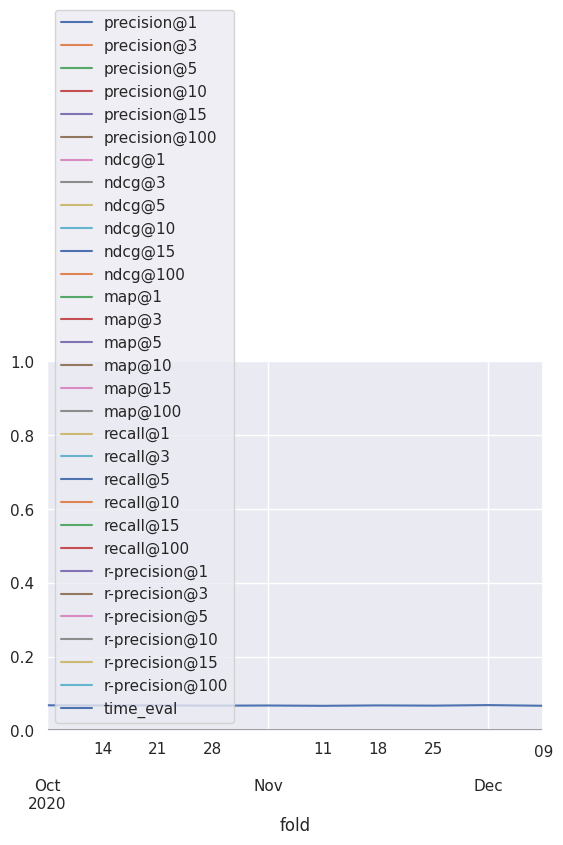

In [15]:
ax = bdf.plot()
ax.set_ylim(0, 1)

### Get perfect data

In [16]:
pdf = paths.load_perfect(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
pdf = pdf[pdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
pdf.mean()

precision@1        0.000000
precision@3        0.000000
precision@5        0.000000
precision@10       0.000000
precision@15       0.000000
precision@100      0.000000
ndcg@1             0.000000
ndcg@3             0.000000
ndcg@5             0.000000
ndcg@10            0.000000
ndcg@15            0.000000
ndcg@100           0.000000
map@1              0.000000
map@3              0.000000
map@5              0.000000
map@10             0.000000
map@15             0.000000
map@100            0.000000
recall@1           0.000000
recall@3           0.000000
recall@5           0.000000
recall@10          0.000000
recall@15          0.000000
recall@100         0.000000
r-precision@1      0.000000
r-precision@3      0.000000
r-precision@5      0.000000
r-precision@10     0.000000
r-precision@15     0.000000
r-precision@100    0.000000
time_eval          0.072954
dtype: float64

In [17]:
pdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2020-10-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.073363
2020-10-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.073125
2020-10-21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.073161
2020-10-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.072518
2020-11-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.073456
2020-11-11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.072518
2020-11-18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.072989
2020-11-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.072493
2020-12-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.073521


(0.0, 1.0)

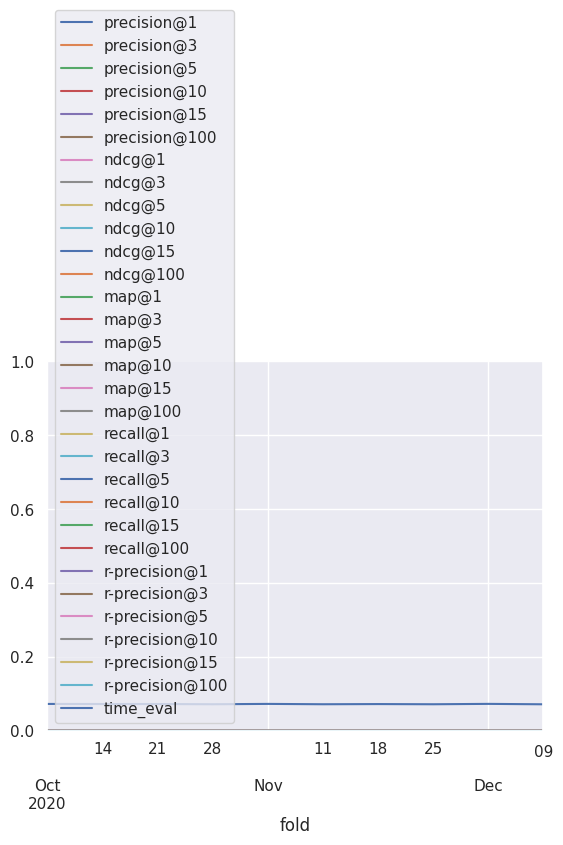

In [18]:
ax = pdf.plot()
ax.set_ylim(0, 1)

## Explore hparams

In [19]:
# Primero, obtenemos la mejor iteración, como si hubiesemos hecho early stopping
hdf = pd.concat(rg.get_dataframe(OPTIM_METRIC, OPTIM_MODE) for rg in result_grids)
print(hdf.columns)
hdf

Index(['real_batch_size', 'iteration', 'loss', 'mf_loss', 'emb_loss',
       'model_recall', 'model_ndcg', 'model_precision', 'model_map',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_eval', 'time_train', 'time_rec', 'time_total_train',
       'time_total_test', 'done', 'training_iteration', 'trial_id', 'date',
       'timestamp', 'time_this_iter_s', 'time_total_s', 'pid', 'hostname',
       'node_ip', 'time_since_restore', 'iterations_since_restore',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_siz

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,logdir
0,29,125,0.151104,1.419845e-01,0.009119,0.027778,0.066667,0.066667,0.066667,0.066667,...,4.377224,25,9,86,2,0.0006,1.343254e-03,21d,2019-10-02T00:00:00,717b17a1
1,99,40,0.080169,8.016314e-02,0.000006,0.000000,0.000000,0.000000,0.000000,0.266667,...,1.981457,8,9,249,2,0.0008,3.772296e-07,10YE,2019-10-02T00:00:00,cc3b76d7
2,35,165,0.012724,0.000000e+00,0.012724,0.058333,0.100000,0.100000,0.100000,0.266667,...,5.887312,33,9,26,2,0.6694,1.427212e-06,30d,2019-10-02T00:00:00,38774e2d
3,69,195,0.281916,2.819102e-01,0.000006,0.016667,0.033333,0.033333,0.033333,0.233333,...,7.819699,39,10,10,1,0.0004,1.708620e-06,90d,2019-10-02T00:00:00,0c4c6bad
4,29,5,0.518484,5.183879e-01,0.000096,0.042778,0.133333,0.133333,0.133333,0.200000,...,0.361759,1,8,71,2,0.0026,3.900168e-05,21d,2019-10-02T00:00:00,67bd6203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,40,120,0.002099,7.815494e-19,0.002099,0.025689,0.078947,0.078947,0.078947,0.210526,...,4.242210,24,9,181,1,0.0957,1.726828e-06,21d,2019-12-04T00:00:00,8caadb9b
96,73,15,0.084096,8.270003e-02,0.001396,0.013158,0.026316,0.026316,0.026316,0.184211,...,0.724862,3,10,13,1,0.0160,1.172188e-04,60d,2019-12-04T00:00:00,2d42c297
97,40,5,0.660987,6.529879e-01,0.007999,0.065163,0.131579,0.131579,0.131579,0.184211,...,0.348030,1,6,15,1,0.0005,7.869799e-03,21d,2019-12-04T00:00:00,d6977eef
98,73,180,0.039532,0.000000e+00,0.039532,0.000000,0.000000,0.000000,0.000000,0.131579,...,6.806534,36,7,35,2,0.9750,9.634412e-07,60d,2019-12-04T00:00:00,cfc4cefe


In [20]:
# Force categorization
hdf['config/fold'] = hdf['config/fold'].astype(str)

fig = px.scatter(hdf, x='map@10', y='ndcg@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [21]:
fig = px.scatter(hdf, x='iteration', y='loss', color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [22]:
fig = px.scatter(hdf, x='iteration', y=OPTIM_METRIC, color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [23]:
fig = px.scatter(hdf, x='loss', y='ndcg@10', color='config/fold', log_x=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [24]:
fig = px.scatter(hdf, x='real_batch_size', y='config/window_size', color='config/fold')
fig

In [25]:
fig = px.scatter(hdf, x=OPTIM_METRIC, y='precision@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_map_precision.pdf')
fig

In [26]:
def plotly_scatter_config(config, log=True):
    config_cols = [c for c in hdf.columns if c.startswith('config/') ]
    return px.scatter(hdf, x=config, y=OPTIM_METRIC, color='config/fold', marginal_x='rug', marginal_y='rug', log_x=log, hover_data=config_cols)

plotly_scatter_config('config/embedding_dim')

In [27]:
plotly_scatter_config('config/window_size', log=False)

In [28]:
plotly_scatter_config('config/learning_rate')

In [29]:
plotly_scatter_config('config/l2')

In [30]:
plotly_scatter_config('config/batch_size', log=False)

In [31]:
plotly_scatter_config('config/conv_layers')

In [32]:
def clean_results(df: pd.DataFrame):
    hparams = [ c.removeprefix('config/') for c in df.columns if c.startswith('config/') and c not in ['config/iteration', 'config/fold'] ]
    return (
        df
        .rename(columns=lambda c: c.removeprefix('config/'),)
        .rename(columns={
            'time_total_train': 'time_train',
            'time_total_test': 'time_eval',
            'time_total_rec': 'time_rec',
        })
        .drop(columns=['real_batch_size'])
        .set_index(['fold', *hparams])
    ), hparams

clean_rdf, hparams = clean_results(rdf.copy())
clean_rdf

iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size              
2019-10-02 512        86            2           0.0006        0.001343 21d                  5   
                                                                       21d                 10   
                                                                       21d                 15   
                                                                       21d                 20   
                                                                       21d                 25   
...                                                                                       ...   
2019-12-04 1024       21            2           0.0205        0.000010 21d                180   
                                                                       21d                185   
                                                                       21d                190   
                                                                       21d                195   
                                                                       21d                200   

                                                                                        loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size             
2019-10-02 512        86            2           0.0006        0.001343 21d          0.557819   
                                                                       21d          0.533044   
                                                                       21d          0.509749   
                                                                       21d          0.492722   
                                                                       21d          0.467536   
...                                                                                      ...   
2019-12-04 1024       21            2           0.0205        0.000010 21d          0.000977   
                                                                       21d          0.000794   
                                                                       21d          0.000833   
                                                                       21d          0.000635   
                                                                       21d          0.000742   

                                                                                     mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size             
2019-10-02 512        86            2           0.0006        0.001343 21d          0.554690   
                                                                       21d          0.529763   
                                                                       21d          0.506289   
                                                                       21d          0.489112   
                                                                       21d          0.463769   
...                                                                                      ...   
2019-12-04 1024       21            2           0.0205        0.000010 21d          0.000543   
                                                                       21d          0.000358   
                                                                       21d          0.000396   
                                                                       21d          0.000194   
                                                                       21d          0.000297   

                                                                                    emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size             
2019-10-02 512        86            2           0.0006        0.001343 21d          0.003129   
                                    

In [33]:
px.scatter(clean_rdf.reset_index(), y='iteration', x='loss', color='fold', log_x=True)

In [34]:
px.scatter(clean_rdf.reset_index(), x='loss', y=OPTIM_METRIC, color='fold', log_x=True)

Letting it run more iterations gets a best loss. But letting it run more does not get a best ndcg or map, as loss and the test results have not a strong correlation.

In [35]:
px.scatter(clean_rdf.reset_index(), y='iteration', x=OPTIM_METRIC, color='fold')

## Choosing best hparams

In [36]:
best_all = clean_rdf.sort_values(OPTIM_METRIC).drop_duplicates('trial_id', keep='last')
paths.save_model_results(best_all, 'lightgcn-all', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best_all

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Genesis Alpha/models/lightgcn-all_7d_normalize.parquet


iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2019-11-06 512        555           4           0.0018        2.994646e-04 10YE               105   
           1024       253           4           0.0001        7.219341e-07 10YE                 5   
2019-11-13 1024       9             1           0.0003        9.239560e-03 60d                 15   
2019-11-06 128        97            4           0.0021        6.099319e-05 10YE               150   
           256        32            4           0.0150        1.242024e-06 10YE                10   
...                                                                                           ...   
2019-10-16 1024       14            3           0.0002        1.697648e-07 90d                200   
2019-10-09 256        241           2           0.0017        5.104822e-06 90d                 20   
2019-10-16 256        724           4           0.0003        1.031295e-03 60d                 20   
2019-10-09 128        97            4           0.0021        6.099319e-05 10YE                 5   
                      1             1           0.3809        2.146937e-04 30d                 15   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2019-11-06 512        555           4           0.0018        2.994646e-04 10YE         0.028393   
           1024       253           4           0.0001        7.219341e-07 10YE         0.674276   
2019-11-13 1024       9             1           0.0003        9.239560e-03 60d          0.678795   
2019-11-06 128        97            4           0.0021        6.099319e-05 10YE         0.019975   
           256        32            4           0.0150        1.242024e-06 10YE         0.088200   
...                                                                                          ...   
2019-10-16 1024       14            3           0.0002        1.697648e-07 90d          0.518392   
2019-10-09 256        241           2           0.0017        5.104822e-06 90d          0.106803   
2019-10-16 256        724           4           0.0003        1.031295e-03 60d          0.523703   
2019-10-09 128        97            4           0.0021        6.099319e-05 10YE         0.576659   
                      1             1           0.3809        2.146937e-04 30d          0.386764   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2019-11-06 512        555           4           0.0018        2.994646e-04 10YE         0.009197   
           1024       253           4           0.0001        7.219341e-07 10YE         0.674275   
2019-11-13 1024       9             1           0.0003        9.239560e-03 60d          0.675754   
2019-11-06 128        97            4           0.0021        6.099319e-05 10YE         0.016002   
           256        32            4           0.0150        1.242024e-06 10YE         0.088156   
...                                                                                          ...   
2019-10-16 1024       14            3           0.0002        1.697648e-07 90d          0.518392   
2019-10-09 256        241           2           0.0017        5.104822e-06 90d          0.106744   
2019-10-16 256        724           4           0.0003        1.031295e-03 60d          0.519146   
2019-10-09 128        97            4           0.0021        6.099319e-05 10YE         0.576486   
                      1             1           0.3809        2.146937e-04 30d          0.385267   

                                                                                            emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2    

### Per fold

In [37]:
# We fix the total time in less than 250 so it has time to do the same number of iterations with the next fold
# best = rdf[rdf['time_total_train'] + rdf['time_total_test'] < 250].sort_values(OPTIM_METRIC).drop_duplicates('config/fold', keep='last').set_index('config/fold').sort_index()
idx = clean_rdf.index.names + ['iteration']
best = clean_rdf.sort_values(OPTIM_METRIC).reset_index().drop_duplicates('fold', keep='last').set_index(idx).sort_index()
paths.save_model_results(best, 'lightgcn-best-val', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Genesis Alpha/models/lightgcn-best-val_7d_normalize.parquet


,,,,,,,,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_train,time_eval,done,trial_id
fold,batch_size,embedding_dim,conv_layers,learning_rate,l2,window_size,iteration,,,,,,,,,,,,,,,,,,,,,
2019-10-02,512,86,3,0.0002,1.667490e-04,30d,10,0.625229,0.624874,3.549493e-04,0.366667,0.255556,0.213333,0.143333,0.113333,0.019333,0.366667,...,0.683333,0.683333,0.683333,0.683333,0.683333,0.001278,0.222624,0.273814,False,5309c9d7
2019-10-09,128,1,1,0.3809,2.146937e-04,30d,15,0.386764,0.385267,1.497250e-03,0.833333,0.291667,0.191667,0.112500,0.075000,0.011250,0.833333,...,0.950000,0.950000,0.950000,0.950000,0.950000,0.001421,0.232194,0.402916,False,789f9509
2019-10-16,256,724,4,0.0003,1.031295e-03,60d,20,0.523703,0.519146,4.556913e-03,0.720000,0.346667,0.232000,0.140000,0.093333,0.014000,0.720000,...,0.895000,0.895000,0.895000,0.895000,0.895000,0.001431,0.312852,0.534552,False,d053b678
2019-10-23,128,6,3,0.0001,5.501362e-07,90d,170,0.668737,0.668737,1.902774e-07,0.571429,0.269841,0.190476,0.138095,0.098413,0.014762,0.571429,...,0.897436,0.910256,0.923077,0.923077,0.923077,0.001186,1.673087,4.632635,False,07813196
2019-10-30,1024,253,4,0.0001,7.219341e-07,10YE,150,0.264414,0.264405,8.884405e-06,0.650000,0.266667,0.190000,0.145000,0.120000,0.020000,0.650000,...,0.829487,0.864103,0.887179,0.887179,0.887179,0.001455,3.058316,4.068805,False,e5883dfe
2019-11-06,512,1019,1,0.0716,6.756707e-03,21d,35,0.718581,0.125649,5.929314e-01,0.280000,0.200000,0.200000,0.176000,0.162667,0.026800,0.280000,...,0.496970,0.581818,0.581818,0.581818,0.581818,0.001268,0.357346,0.968009,False,a2376300
2019-11-13,256,6,4,0.0037,5.416566e-05,10YE,20,0.353003,0.352581,4.218214e-04,0.461538,0.256410,0.215385,0.146154,0.112821,0.020000,0.461538,...,0.777778,0.805556,0.819444,0.819444,0.819444,0.001533,0.528955,0.555621,False,42075d36
2019-11-20,512,7,4,0.1593,2.919033e-06,21d,110,0.001805,0.001342,4.628669e-04,0.352941,0.235294,0.188235,0.152941,0.105882,0.015882,0.352941,...,0.875000,0.785714,0.785714,0.785714,0.785714,0.001221,0.928553,2.809917,False,cf088858
2019-11-27,64,217,2,0.4785,2.539909e-06,21d,155,3.028449,2.940494,8.795465e-02,0.388889,0.370370,0.277778,0.222222,0.148148,0.022222,0.388889,...,0.805556,0.851852,0.851852,0.851852,0.851852,0.001264,1.009218,4.085282,False,4f4ce972


,precision@5,map@10
count,10.000000,10.000000
mean,0.210414,0.577744
std,0.027547,0.160114
min,0.188235,0.321011
25%,0.190774,0.473208
50%,0.202632,0.580393
75%,0.214872,0.654270
max,0.277778,0.843502


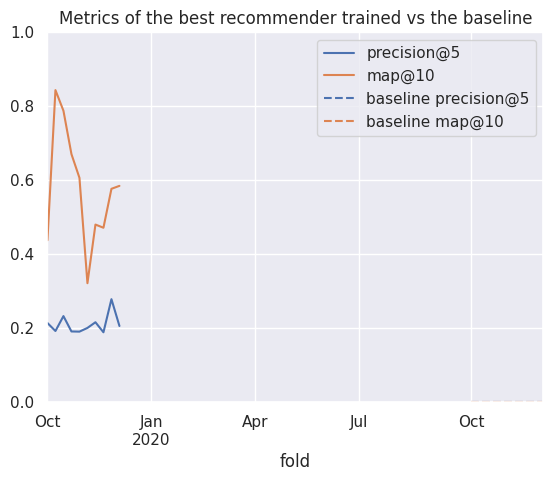

In [38]:
cols2plot = ['precision@5', 'map@10']

ax = best.reset_index().set_index('fold')[cols2plot].plot()
ax.set_ylim(0, 1)

bdf[cols2plot].rename(columns='baseline {}'.format).plot(ax=ax, style='--', color=[l.get_color() for l in ax.lines])

plt.title("Metrics of the best recommender trained vs the baseline")
best[cols2plot].describe()

In [39]:
best[['precision@5', 'ndcg@5', 'precision@10', 'ndcg@10', 'map@5', 'map@10']].mean()

precision@5     0.210414
ndcg@5          0.581040
precision@10    0.154467
ndcg@10         0.671768
map@5           0.529606
map@10          0.577744
dtype: float64

## Realisitc model (repeating hparams)

In [40]:
from pandas.api.types import is_float_dtype

config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]
config_cols2 = config_cols + ['config/iteration']

all_configs = rdf.copy()
display(all_configs)
all_configs['config/fold'] = (pd.to_datetime(all_configs['config/fold']) + pd.tseries.frequencies.to_offset(SPLITS_FREQ)) # .astype(str)

# Leonardo Torres de Quevedo, perdoname por lo que voy a hacer
float_cols = [c for c in config_cols if is_float_dtype(all_configs[c].dtype) ]
all_configs[float_cols] = all_configs[float_cols].astype(str)
all_configs = all_configs.set_index(config_cols)
all_configs_index = all_configs.index

# all_configs_index = pd.MultiIndex.from_frame(all_configs[config_cols].astype(str))[:-1]

# No podemos utilizar los indices "tal cual" pues la coma flotante
# no encaja entre un fold y otro. Así que lo convierto a string
# y luego de nuevo a coma flotante.
# La otra solución sería usar np.isclose, pero habría que programar
# varias lineas y hacer nuestra propia función de búsqueda por cada
# columna o algo así
# O también, en lugar de str, multiplicar por 10^7 (el min. es 10**-7),
# pasar a entero, y luego dividir
aux = rdf.copy()
aux[float_cols] = aux[float_cols].astype(str)
aux = aux.set_index(config_cols)
print("Index intersection:", aux.index.intersection(all_configs_index))
all_realistic = aux.loc[aux.index.intersection(all_configs_index)]
# all_realistic.index = all_realistic.index.set_levels(
#     [ pd.to_numeric(l) for l in realistic.index.levels ]
# )
all_realistic

,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,29,5,0.557819,0.554690,0.003129,0.066667,0.077778,0.073333,0.103333,0.122222,...,0.137477,False,717b17a1,512,86,2,0.0006,0.001343,21d,2019-10-02
1,29,10,0.533044,0.529763,0.003281,0.066667,0.077778,0.073333,0.103333,0.120000,...,0.274559,False,717b17a1,512,86,2,0.0006,0.001343,21d,2019-10-02
2,29,15,0.509749,0.506289,0.003460,0.066667,0.077778,0.080000,0.103333,0.120000,...,0.410597,False,717b17a1,512,86,2,0.0006,0.001343,21d,2019-10-02
3,29,20,0.492722,0.489112,0.003610,0.066667,0.100000,0.086667,0.103333,0.117778,...,0.549647,False,717b17a1,512,86,2,0.0006,0.001343,21d,2019-10-02
4,29,25,0.467536,0.463769,0.003767,0.066667,0.100000,0.093333,0.096667,0.117778,...,0.689122,False,717b17a1,512,86,2,0.0006,0.001343,21d,2019-10-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,40,180,0.000977,0.000543,0.000434,0.157895,0.157895,0.178947,0.168421,0.112281,...,4.862079,False,0d312d50,1024,21,2,0.0205,0.000010,21d,2019-12-04
36,40,185,0.000794,0.000358,0.000437,0.157895,0.166667,0.178947,0.168421,0.112281,...,4.995195,False,0d312d50,1024,21,2,0.0205,0.000010,21d,2019-12-04
37,40,190,0.000833,0.000396,0.000436,0.157895,0.157895,0.178947,0.168421,0.112281,...,5.131063,False,0d312d50,1024,21,2,0.0205,0.000010,21d,2019-12-04
38,40,195,0.000635,0.000194,0.000441,0.157895,0.166667,0.178947,0.168421,0.112281,...,5.265653,False,0d312d50,1024,21,2,0.0205,0.000010,21d,2019-12-04


Index intersection: MultiIndex([( 512, 447, 3,                '0.0008', ...),
            (  64, 217, 2,   '0.47850000000000004', ...),
            ( 512, 227, 1,                '0.0001', ...),
            ( 256,  27, 2,                '0.2056', ...),
            ( 512,  86, 2, '0.0006000000000000001', ...),
            ( 256, 241, 2, '0.0017000000000000001', ...),
            ( 512,   7, 4,                '0.1593', ...),
            ( 512,   3, 2,                '0.0001', ...),
            ( 128,  34, 2,                '0.0091', ...),
            (1024,   1, 1, '0.0029000000000000002', ...),
            ...
            ( 256,  96, 2,                '0.0784', ...),
            ( 256, 219, 4,                 '0.095', ...),
            ( 128,  74, 2,                '0.1736', ...),
            (  64, 217, 2,   '0.47850000000000004', ...),
            ( 256,  27, 2,                '0.2056', ...),
            ( 512,  86, 2, '0.0006000000000000001', ...),
            ( 512,  26, 2,          

real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                    
512               447                  3                  0.0008               0.00012930138476387965 60d                2019-10-09                50   
                                                                                                                         2019-10-09                50   
                                                                                                                         2019-10-09                50   
                                                                                                                         2019-10-09                50   
                                                                                                                         2019-10-09                50   
...                                                                                                                                               ...   
256               32                   4                  0.015000000000000001 1.242023640083893e-06  10YE               2019-12-04               122   
                                                                                                                         2019-12-04               122   
                                                                                                                         2019-12-04               122   
                                                                                                                         2019-12-04               122   
                                                                                                                         2019-12-04               122   

                                                                                                                                      config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                     
512               447                  3                  0.0008               0.00012930138476387965 60d                2019-10-09                  5   
                                                                                                                         2019-10-09                 10   
                                                                                                                         2019-10-09                 15   
                                                                                                                         2019-10-09                 20   
                                                                                                                         2019-10-09                 25   
...                                                                                                                                                ...   
256               32                   4                  0.015000000000000001 1.242023640083893e-06  10YE               2019-12-04                180   
                                                                                                                         2019-12-04                185   
                                                                                                                         2019-12-04                190   
                                                                                                                         2019-12-04                195   
                                                                                                                         2019-12-04                200   

                                                                                                                                          los

In [41]:
def bestByFold(df):
    idx = df[OPTIM_METRIC].idxmax()
    return df.loc[idx]

best_configs = (
    all_configs.loc[all_configs.index.intersection(all_realistic.index)]
    .reset_index()
    .groupby("config/fold")
    .apply(bestByFold)
    .set_index(config_cols)
    # .rename(columns="best_{}".format)
)
best_configs

/tmp/ipykernel_3815319/543710717.py:9: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,,,,,,,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_total_train,time_total_test,done,trial_id
config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,,,,,,,,,,,,,,,,,,,,,
512,86,3,0.0002,0.00016674901474097163,30d,2019-10-09,35,10,0.625229,0.624874,3.549493e-04,0.366667,0.255556,0.213333,0.143333,0.113333,...,0.683333,0.683333,0.683333,0.683333,0.683333,0.001278,0.222624,0.273814,False,5309c9d7
128,97,4,0.0021000000000000003,6.099318557930143e-05,10YE,2019-10-16,100,5,0.576659,0.576486,1.731093e-04,0.750000,0.291667,0.191667,0.112500,0.075000,...,0.972222,0.972222,0.972222,0.972222,0.972222,0.023391,0.236062,0.133125,False,e4ef755e
1024,14,3,0.0002,1.6976478757694798e-07,90d,2019-10-23,70,200,0.518392,0.518392,3.360460e-07,0.720000,0.306667,0.224000,0.140000,0.093333,...,0.878947,0.889474,0.889474,0.889474,0.889474,0.001493,1.836643,5.258437,True,5c2d3d10
128,6,3,0.0001,5.501361577362616e-07,90d,2019-10-30,69,170,0.668737,0.668737,1.902774e-07,0.571429,0.269841,0.190476,0.138095,0.098413,...,0.897436,0.910256,0.923077,0.923077,0.923077,0.001186,1.673087,4.632635,False,07813196
1024,253,4,0.0001,7.219341216911661e-07,10YE,2019-11-06,109,145,0.286219,0.286210,8.628282e-06,0.650000,0.266667,0.190000,0.145000,0.120000,...,0.829487,0.864103,0.887179,0.887179,0.887179,0.001599,2.962714,3.934293,False,e5883dfe
512,341,1,0.22920000000000001,0.0005027971583482147,21d,2019-11-13,57,200,3.613748,1.268551,2.345196e+00,0.240000,0.200000,0.192000,0.176000,0.160000,...,0.415476,0.431111,0.442222,0.442222,0.442222,0.002313,1.329884,5.421582,True,46411698
128,6,4,0.0011,0.00020738661193291406,10YE,2019-11-20,116,85,0.303823,0.301678,2.144974e-03,0.384615,0.269231,0.207692,0.150000,0.115385,...,0.756410,0.740476,0.752381,0.752381,0.752381,0.001752,2.113846,2.442274,False,227d3e7c
512,7,4,0.1593,2.91903327474456e-06,21d,2019-11-27,50,110,0.001805,0.001342,4.628669e-04,0.352941,0.235294,0.188235,0.152941,0.105882,...,0.875000,0.785714,0.785714,0.785714,0.785714,0.001221,0.928553,2.809917,False,cf088858
64,217,2,0.47850000000000004,2.539908649333967e-06,21d,2019-12-04,46,155,3.028449,2.940494,8.795465e-02,0.388889,0.370370,0.277778,0.222222,0.148148,...,0.805556,0.851852,0.851852,0.851852,0.851852,0.001264,1.009218,4.085282,False,4f4ce972


In [42]:
best_realistic = all_realistic.join(best_configs.rename(columns="best_{}".format), how='right')

# Display the configs, to see that nothing is missing
display(best_realistic.groupby(best_realistic.index).size())

# First, do the "early stopping" (keep only the ones that are the same iterations or less)
best_realistic = best_realistic[best_realistic['config/iteration'] <= best_realistic['best_config/iteration']]
# Now, lets keep just the one with the best iteration
best_realistic = (
    best_realistic.sort_values('config/iteration')
    .groupby('config/fold')
    .tail(1)
    .sort_index()
    .reset_index()
    .set_index('config/fold')
    .sort_index()
)
best_realistic

(64, 217, 2, 0.47850000000000004, 2.539908649333967e-06, 21d, 2019-12-04 00:00:00)       80
(128, 6, 3, 0.0001, 5.501361577362616e-07, 90d, 2019-10-30 00:00:00)                     40
(128, 6, 4, 0.0011, 0.00020738661193291406, 10YE, 2019-11-20 00:00:00)                   40
(128, 97, 4, 0.0021000000000000003, 6.099318557930143e-05, 10YE, 2019-10-16 00:00:00)    40
(512, 7, 4, 0.1593, 2.91903327474456e-06, 21d, 2019-11-27 00:00:00)                      40
(512, 86, 3, 0.0002, 0.00016674901474097163, 30d, 2019-10-09 00:00:00)                   40
(512, 341, 1, 0.22920000000000001, 0.0005027971583482147, 21d, 2019-11-13 00:00:00)      40
(1024, 14, 3, 0.0002, 1.6976478757694798e-07, 90d, 2019-10-23 00:00:00)                  40
(1024, 253, 4, 0.0001, 7.219341216911661e-07, 10YE, 2019-11-06 00:00:00)                 40
dtype: int64

,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,real_batch_size,config/iteration,loss,mf_loss,...,best_r-precision@3,best_r-precision@5,best_r-precision@10,best_r-precision@15,best_r-precision@100,best_time_rec,best_time_total_train,best_time_total_test,best_done,best_trial_id
config/fold,,,,,,,,,,,,,,,,,,,,,
2019-10-09,512,86,3,0.0002,0.00016674901474097163,30d,39,10,0.619265,0.618896,...,0.683333,0.683333,0.683333,0.683333,0.683333,0.001278,0.222624,0.273814,False,5309c9d7
2019-10-16,128,97,4,0.0021000000000000003,6.099318557930143e-05,10YE,102,5,0.575852,0.575680,...,0.972222,0.972222,0.972222,0.972222,0.972222,0.023391,0.236062,0.133125,False,e4ef755e
2019-10-23,1024,14,3,0.0002,1.6976478757694798e-07,90d,69,200,0.513183,0.513182,...,0.878947,0.889474,0.889474,0.889474,0.889474,0.001493,1.836643,5.258437,True,5c2d3d10
2019-10-30,128,6,3,0.0001,5.501361577362616e-07,90d,73,170,0.670498,0.670497,...,0.897436,0.910256,0.923077,0.923077,0.923077,0.001186,1.673087,4.632635,False,07813196
2019-11-06,1024,253,4,0.0001,7.219341216911661e-07,10YE,113,145,0.275800,0.275791,...,0.829487,0.864103,0.887179,0.887179,0.887179,0.001599,2.962714,3.934293,False,e5883dfe
2019-11-13,512,341,1,0.22920000000000001,0.0005027971583482147,21d,58,200,2.964082,0.281825,...,0.415476,0.431111,0.442222,0.442222,0.442222,0.002313,1.329884,5.421582,True,46411698
2019-11-20,128,6,4,0.0011,0.00020738661193291406,10YE,117,85,0.292945,0.290627,...,0.756410,0.740476,0.752381,0.752381,0.752381,0.001752,2.113846,2.442274,False,227d3e7c
2019-11-27,512,7,4,0.1593,2.91903327474456e-06,21d,46,110,0.025657,0.025244,...,0.875000,0.785714,0.785714,0.785714,0.785714,0.001221,0.928553,2.809917,False,cf088858
2019-12-04,64,217,2,0.47850000000000004,2.539908649333967e-06,21d,40,155,0.076224,0.000000,...,0.805556,0.851852,0.851852,0.851852,0.851852,0.001264,1.009218,4.085282,False,4f4ce972


In [43]:
paths.save_model_results(
    clean_results(best_realistic.reset_index().copy())[0],
    'lightgcn-best-test',
    ORG_NAME,
    SPLITS_FREQ,
    SPLITS_NORMALIZE,
    K_RECOMMENDATIONS,
)

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Genesis Alpha/models/lightgcn-best-test_7d_normalize.parquet


,precision@5,map@10
count,9.000000,9.000000
mean,0.160207,0.358628
std,0.068706,0.214929
min,0.056000,0.066937
25%,0.117647,0.207481
50%,0.166667,0.354481
75%,0.205263,0.467394
max,0.277778,0.759397


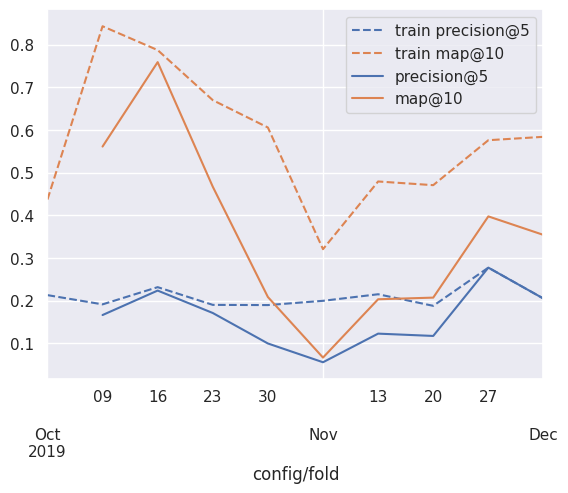

In [44]:
_toplot = best_realistic.copy().sort_index()
_toplot.index = pd.to_datetime(_toplot.index)

ax = best.reset_index().set_index('fold')[cols2plot].rename(columns='train {}'.format).plot(style='--', color=[l.get_color() for l in ax.lines])
# plt.xticks(range(10))
# bdf[cols2plot].rename(columns='baseline {}'.format).reset_index(drop=True).plot(ax=ax, style=':', color=[l.get_color() for l in ax.lines])

_toplot[cols2plot].plot(ax=ax)
# ax.set_ylim(0, 1)

_toplot[cols2plot].describe()

In [45]:
best_realistic.index.min()

Timestamp('2019-10-09 00:00:00')

In [46]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2020-10-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.069698
2020-10-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.069204
2020-10-21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.069358
2020-10-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.068687
2020-11-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.069121
2020-11-11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.068275
2020-11-18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.069388
2020-11-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.068770
2020-12-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.070209


In [47]:
_PERFECT_NAME = 'Ground Truth'
_LEAK_NAME = 'Leaky GNN'
CAT_ORDER = [_PERFECT_NAME, _LEAK_NAME, 'GNN', 'OpenPop']

def _get_toplot_table(metrics2plot=cols2plot, oracle=True, perfect=None, common_only=False):
    if perfect is None:
        perfect = metrics2plot
    
    # _toplot = best_realistic.copy()
    # _toplot.index = pd.to_numeric(_toplot.index)
    # _toplot['fold'] = _toplot.index

    _first_real_fold_idx = best_realistic.index.min()
    
    _toplot_real = best_realistic[metrics2plot].copy()
    _toplot_real['fold'] = pd.to_datetime(_toplot_real.index) # .astype(int)
    _toplot_real['rec'] = 'GNN'

    _toplot_base = bdf[metrics2plot].copy()
    # fold2str = _toplot_base.index.strftime('%G-W%V')
    # _toplot_base['fold'] = range(len(_toplot_base))
    _toplot_base['fold'] = pd.to_datetime(_toplot_base.index)
    _toplot_base['rec'] = 'OpenPop'

    # _colsbest = map("best_{}".format, _cols)
    if oracle:
        _toplot_best = best.reset_index().set_index('fold')[metrics2plot].copy() # [_colsbest].rename(columns=lambda x: x.split("_", 1)[-1])
        _toplot_best['fold'] = _toplot_best.index
        _toplot_best['rec'] = _LEAK_NAME
    else:
        _toplot_best = None
        _toplot_base = _toplot_base[_toplot_base['fold'] >= _first_real_fold_idx]
        _toplot_real = _toplot_real[_toplot_real['fold'] >= _first_real_fold_idx]

    if perfect:
        _toplot_perfect = pdf[perfect].copy()
        _toplot_perfect['fold'] = pd.to_datetime(_toplot_perfect.index)
        _toplot_perfect['rec'] = _PERFECT_NAME
        # Make same len as baseline
        # _toplot_perfect = _toplot_perfect.iloc[-len(_toplot_base):]
        _toplot_perfect = _toplot_perfect.loc[_toplot_base.index]
        assert _toplot_perfect.index.equals(_toplot_base.index)
    else:
        _toplot_perfect = None
        
    _toplot = (
        pd.concat((
            _toplot_real, 
            _toplot_best,
            _toplot_base,
            _toplot_perfect,
        ), ignore_index=True)
        .melt(id_vars=['fold', 'rec'], value_vars=metrics2plot, var_name='metric')
    )

    assert pd.api.types.is_datetime64_any_dtype(_toplot['fold'].dtype), "Fold column should be datetime"
    assert not (_toplot['fold'].isna()).any()
    
    _toplot['rec'] = pd.Categorical(_toplot['rec'], CAT_ORDER)
    _toplot['fold_week'] = _toplot['fold'].dt.strftime('%G-W%V') # fold2str[_toplot['fold']]

    return _toplot.sort_values('fold')

_tablecols = ['precision@5', 'precision@10', 'recall@5', 'recall@10', 'map@5', 'map@10', 'ndcg@5', 'ndcg@10']
_table = _get_toplot_table(_tablecols)
# Skip the first fold so everyone has 9 folds and metrics are consistent
_table = _table[_table['fold'] >= best_realistic.index.min()]
print(_table.groupby(['rec', 'metric'])['value'].mean().unstack(level=-1)[_tablecols].rename(
    index={
        'Perfect': 'Ground Truth',
        'realistic': 'GNN'
    }
).style.format(precision=2).to_latex())
_table.groupby(['rec', 'metric']).describe()

\begin{tabular}{lrrrrrrrr}
metric & precision@5 & precision@10 & recall@5 & recall@10 & map@5 & map@10 & ndcg@5 & ndcg@10 \\
rec &  &  &  &  &  &  &  &  \\
Ground Truth & 0.00 & 0.00 & 0.00 & 0.00 & 0.00 & 0.00 & 0.00 & 0.00 \\
Leaky GNN & 0.21 & 0.16 & 0.65 & 0.91 & 0.54 & 0.59 & 0.59 & 0.68 \\
GNN & 0.16 & 0.13 & 0.47 & 0.73 & 0.31 & 0.36 & 0.37 & 0.46 \\
OpenPop & 0.00 & 0.00 & 0.00 & 0.00 & 0.00 & 0.00 & 0.00 & 0.00 \\
\end{tabular}



/tmp/ipykernel_3815319/3868849439.py:68: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_3815319/3868849439.py:74: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



fold                                            \
                          count                 mean                  min   
rec          metric                                                         
Ground Truth map@10          10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             map@5           10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             ndcg@10         10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             ndcg@5          10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             precision@10    10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             precision@5     10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             recall@10       10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             recall@5        10  2020-11-07 12:00:00  2020-10-07 00:00:00   
Leaky GNN    map@10           9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             map@5            9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             ndcg@10          9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             ndcg@5           9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             precision@10     9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             precision@5      9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             recall@10        9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             recall@5         9  2019-11-06 00:00:00  2019-10-09 00:00:00   
GNN          map@10           9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             map@5            9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             ndcg@10          9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             ndcg@5           9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             precision@10     9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             precision@5      9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             recall@10        9  2019-11-06 00:00:00  2019-10-09 00:00:00   
             recall@5         9  2019-11-06 00:00:00  2019-10-09 00:00:00   
OpenPop      map@10          10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             map@5           10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             ndcg@10         10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             ndcg@5          10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             precision@10    10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             precision@5     10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             recall@10       10  2020-11-07 12:00:00  2020-10-07 00:00:00   
             recall@5        10  2020-11-07 12:00:00  2020-10-07 00:00:00   

                                                                     \
                                           25%                  50%   
rec          metric                                                   
Ground Truth map@10        2020-10-22 18:00:00  2020-11-07 12:00:00   
             map@5         2020-10-22 18:00:00  2020-11-07 12:00:00   
             ndcg@10       2020-10-22 18:00:00  2020-11-07 12:00:00   
             ndcg@5        2020-10-22 18:00:00  2020-11-07 12:00:00   
             precision@10  2020-10-22 18:00:00  2020-11-07 12:00:00   
             precision@5   2020-10-22 18:00:00  2020-11-07 12:00:00   
             recall@10     2020-10-22 18:00:00  2020-11-07 12:00:00   
             recall@5      2020-10-22 18:00:00  2020-11-07 12:00:00   
Leaky GNN    map@10        2019-10-23 00:00:00  2019-11-06 00:00:00   
             map@5         2019-10-23 00:00:00  2019-11-06 00:00:00   
             ndcg@10       2019-10-23 00:00:00  2019-11-06 00:00:00   
             ndcg@5        2019-10-23 00:00:00  2019-11-06 00:00:00   
             precision@10  2019-10-23 00:00:00  2019-11-06 00:00:00   
             precision@5   2019-10-23 00:00:00  2019-11-06 00:00:00   
             recall@10     2019-10-23 00:00:00  2019-11-06 00:00:00   
             recall@5      2019-10-23 00:00:00  2019-

/tmp/ipykernel_3815319/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3815319/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



count      mean       std       min       25%  \
rec          metric                                                       
Ground Truth map@10        10.0  0.000000  0.000000  0.000000  0.000000   
             precision@5   10.0  0.000000  0.000000  0.000000  0.000000   
Leaky GNN    map@10        10.0  0.577744  0.160114  0.321011  0.473208   
             precision@5   10.0  0.210414  0.027547  0.188235  0.190774   
GNN          map@10         9.0  0.358628  0.214929  0.066937  0.207481   
             precision@5    9.0  0.160207  0.068706  0.056000  0.117647   
OpenPop      map@10        10.0  0.000000  0.000000  0.000000  0.000000   
             precision@5   10.0  0.000000  0.000000  0.000000  0.000000   

                               50%       75%       max  
rec          metric                                     
Ground Truth map@10       0.000000  0.000000  0.000000  
             precision@5  0.000000  0.000000  0.000000  
Leaky GNN    map@10       0.580393  0.654270  0.843502  
             precision@5  0.202632  0.214872  0.277778  
GNN          map@10       0.354481  0.467394  0.759397  
             precision@5  0.166667  0.205263  0.277778  
OpenPop      map@10       0.000000  0.000000  0.000000  
             precision@5  0.000000  0.000000  0.000000

Cannot show ipywidgets in text

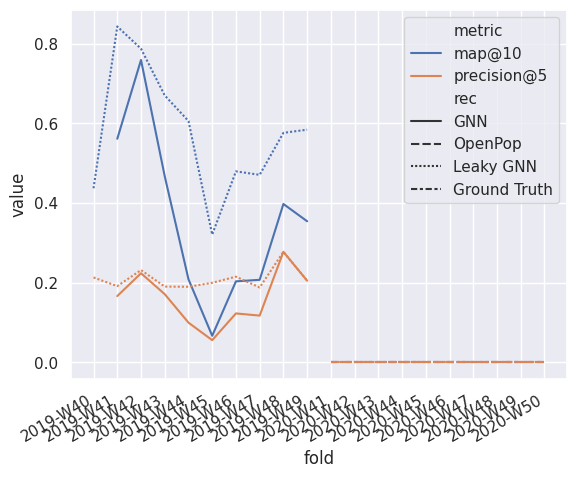

In [48]:
def plot_gnn_results(metrics2plot=cols2plot, oracle=False, perfect=None, common_only=False):
    _toplot = _get_toplot_table(metrics2plot, oracle, perfect)

    if common_only:
        _toplot = _toplot[_toplot['fold'] >= best_realistic.index.min()]

    ax = sns.lineplot(
        _toplot, x='fold_week', y='value', 
        hue='metric' if len(metrics2plot) > 1 else None, 
        style='rec',
        style_order=['GNN', 'OpenPop', _LEAK_NAME, _PERFECT_NAME],
    )
    ax.set_xlabel('fold')
    
    if len(metrics2plot) == 1:
        ax.set_ylabel(metrics2plot[0])
        ax.legend_.set_title(None)

    # ax.set_xticks(ax.get_xticks()[1:-1], _toplot_base.index.strftime('%G-W%V'), rotation=30, ha='right')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

    display(_toplot.groupby(['rec', 'metric'])['value'].describe())
    # print(_toplot.groupby(['rec', 'metric'])['value'].describe()[['mean', 'std', '50%', 'min', 'max']].to_html())

    return ax

ax = plot_gnn_results(oracle=True) # perfect=['precision@5'])
download_matplotlib(ax.figure, '09_gnn_results.pdf')

/tmp/ipykernel_3815319/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3815319/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000
GNN,precision@5,9.0,0.160207,0.068706,0.056,0.117647,0.166667,0.205263,0.277778
OpenPop,precision@5,10.0,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000


Cannot show ipywidgets in text

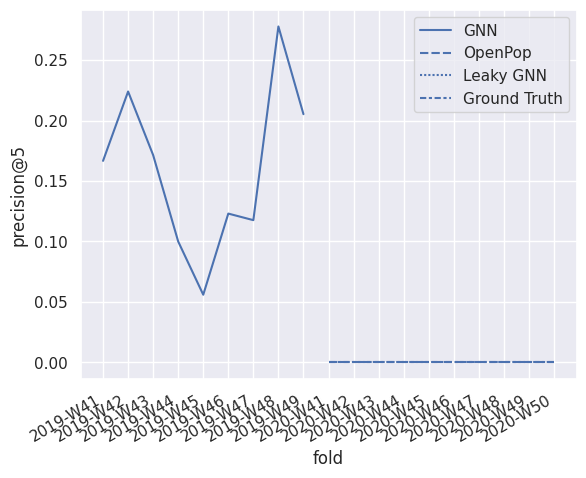

In [49]:
ax = plot_gnn_results(['precision@5'])
ax.figure.savefig('../figures/09_gnn_results_precision_5.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_precision_5.pdf')

/tmp/ipykernel_3815319/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3815319/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Leaky GNN,precision@5,9.0,0.210089,0.029198,0.188235,0.190476,0.200000,0.215385,0.277778
GNN,precision@5,9.0,0.160207,0.068706,0.056000,0.117647,0.166667,0.205263,0.277778
OpenPop,precision@5,10.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Cannot show ipywidgets in text

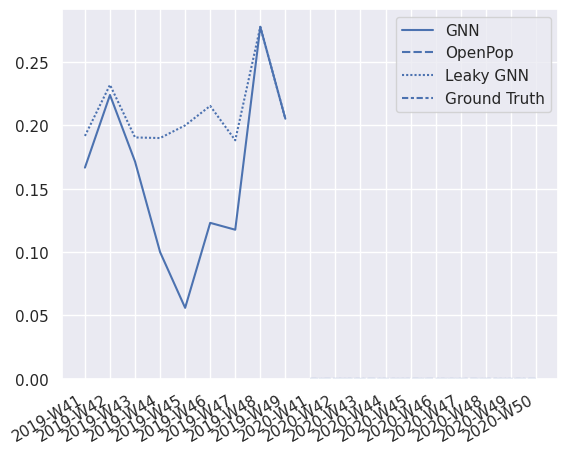

In [50]:
ax = plot_gnn_results(['precision@5'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_precision_5_leaky.pdf')

/tmp/ipykernel_3815319/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3815319/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,map@10,10.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
GNN,map@10,9.0,0.358628,0.214929,0.066937,0.207481,0.354481,0.467394,0.759397
OpenPop,map@10,10.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Cannot show ipywidgets in text

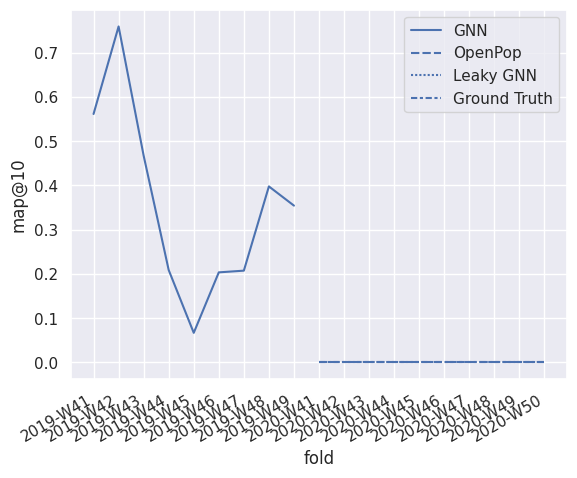

In [51]:
ax = plot_gnn_results(['map@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_map_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_map_10.pdf')

/tmp/ipykernel_3815319/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3815319/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.000000,0.000000,0.00000,0.000000,0.000000,0.0000,0.000000
GNN,ndcg@10,9.0,0.463747,0.220215,0.12847,0.292038,0.523343,0.5623,0.829448
OpenPop,ndcg@10,10.0,0.000000,0.000000,0.00000,0.000000,0.000000,0.0000,0.000000


Cannot show ipywidgets in text

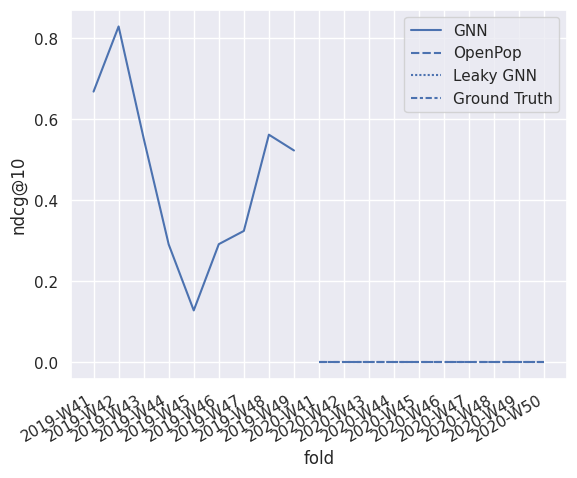

In [52]:
ax = plot_gnn_results(['ndcg@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_ndcg_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_ndcg_10.pdf')

/tmp/ipykernel_3815319/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3815319/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
Leaky GNN,ndcg@10,9.0,0.684462,0.137092,0.445989,0.591890,0.694842,0.74552,0.884569
GNN,ndcg@10,9.0,0.463747,0.220215,0.128470,0.292038,0.523343,0.56230,0.829448
OpenPop,ndcg@10,10.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000


Cannot show ipywidgets in text

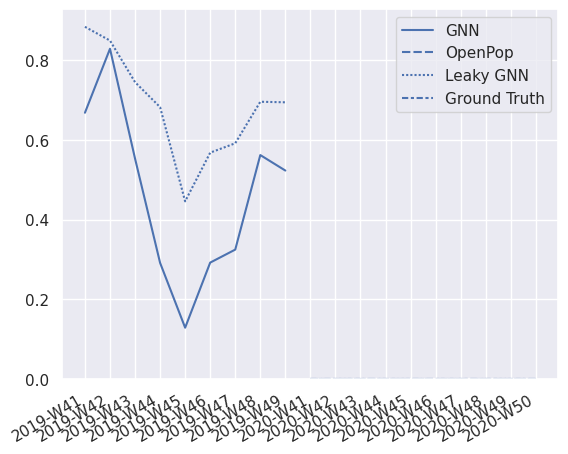

In [53]:
ax = plot_gnn_results(['ndcg@10'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_ndcg_10_leaky.pdf')